Filename: ../data/fits/PROMISE-Q1-8micron-filled-v0_3.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      44   (120000, 12000)   float32   


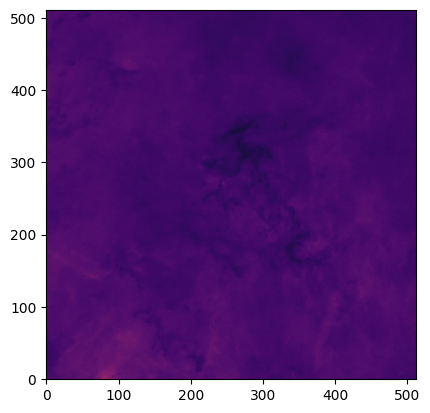

In [18]:
import pywt
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


## This code is from photutils_test.ipynb
FITS_PATH = '../data/fits/PROMISE-Q1-8micron-filled-v0_3.fits'
# FITS_PATH = '../data/fits/box47346.223_5974.1909_21.600045_21.600045_0.0.fits'

XSIZE: int = 512
YSIZE: int = 512
X: int = 49300
Y: int = 6000

# Open currimg and display info using memmap to not load the whole image into memory
imageHDU = fits.open(FITS_PATH, memmap=True, mode='denywrite')
imageHDU.info()

# Get display image as Numpy Array called data
data : np.ndarray[np.float32] = np.array(imageHDU[0].data[Y:Y+YSIZE, X:X+XSIZE], dtype=np.float32) # type: ignore
imageHDU.close() # Close the file

# load cameraman.tif
# data = mpimg.imread('cameraman.tif')

plt.style.use({"image.origin": "lower", "image.interpolation": "nearest"})

# Display data
plt.imshow(data, cmap='inferno') #nipy_spectral, inferno, plasma, magma, viridis <- all good

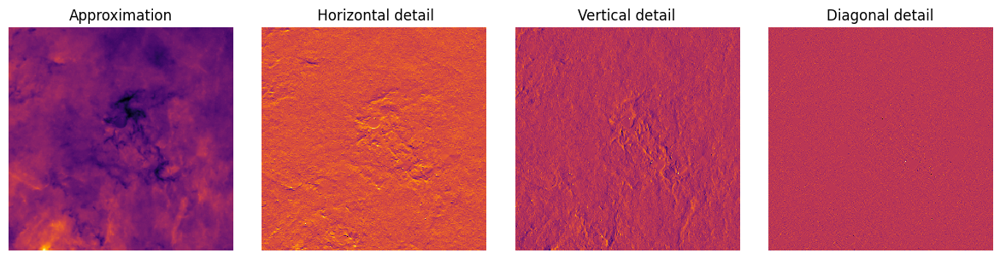

In [19]:
# demo from docs https://pywavelets.readthedocs.io/en/latest/
# Wavelet transform of image, and plot approximation and details

from scipy.ndimage import gaussian_filter
# data : np.ndarray[np.float32] = gaussian_filter(data, 3)

titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
coeffs2 = pywt.dwt2(data, 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, cmap="inferno")
    ax.set_title(titles[i])
    ax.axis('off')

fig.tight_layout()
plt.show()

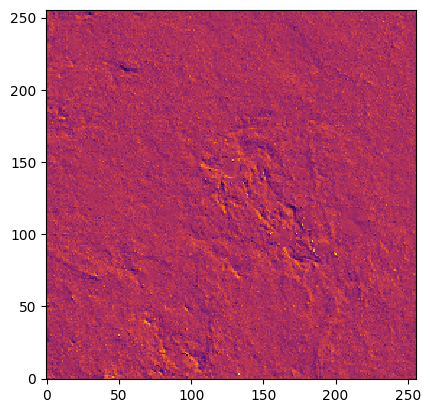

In [20]:
# combine details like Jouni showed
plt.imshow(LH+HL+HH, cmap='inferno')
# maybe I am doing something wrong because the clouds are really hard to see

Max level: 7


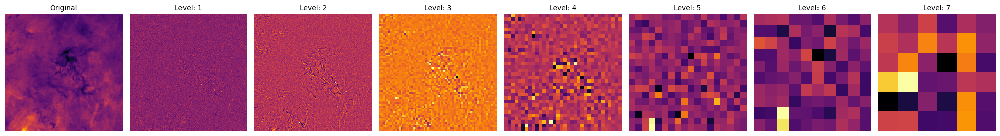

In [17]:
# visualize different levels of wavelet transform
wavelet = "db2"
max_level = pywt.dwtn_max_level(data.shape, wavelet)
print("Max level: "+str(max_level))

fig = plt.figure(figsize=(20, 3))
LL = data

# add original image
ax = fig.add_subplot(1, max_level+1, 1)
ax.imshow(data, cmap='inferno')
ax.set_title("Original", fontsize=10)
ax.axis('off')

for level in range(1,max_level+1):
    coeffs = pywt.dwt2(LL, wavelet)
    LL, (LH, HL, HH) = coeffs
    
    ax = fig.add_subplot(1, max_level+1, level+1)
    ax.imshow(LH+HL+HH, cmap='inferno')
    ax.set_title("Level: "+str(level), fontsize=10)
    ax.axis('off')

fig.tight_layout()
plt.show()

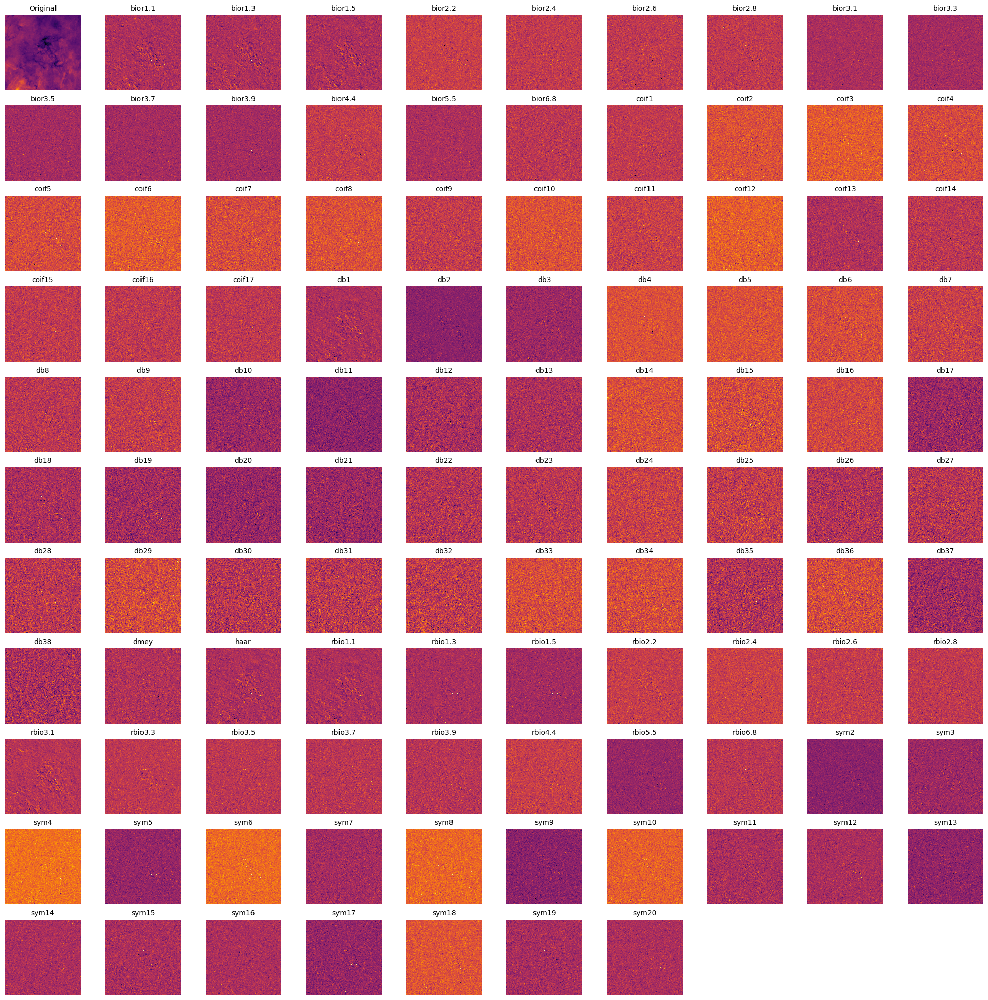

In [21]:
# visualize different wavelets of level 1, haar is the one to use probably
fig = plt.figure(figsize=(25, 25))
wavelets = pywt.wavelist(kind='discrete')

ax = fig.add_subplot(len(wavelets)//10+1, 10, 1)
ax.imshow(data, cmap='inferno')
ax.set_title("Original", fontsize=10)
ax.axis('off')

for wavelet in wavelets:
    coeffs = pywt.dwt2(data, wavelet)
    LL, (LH, HL, HH) = coeffs
    
    ax = fig.add_subplot((len(wavelets)+1)//10+1, 10, wavelets.index(wavelet)+2)
    ax.imshow(LH+HL+HH, cmap='inferno')
    ax.set_title(wavelet, fontsize=10)
    ax.axis('off')

Original Mean: 104.9179 Std: 11.765227 Max: 211.38313 Min: 50.603386
Level: 1 Mean: 0.042329311819514714 Std: 1.1768286901725407 Max: 11.217416763305664 Min: -9.606459617614746
Level: 2 Mean: 0.0826092106269698 Std: 1.5589375146197053 Max: 9.994102478027344 Min: -14.075374603271484
Level: 3 Mean: 0.14695676397423085 Std: 2.2668549065817274 Max: 17.191547393798828 Min: -12.45302677154541
Level: 4 Mean: 0.2450708367759944 Std: 3.085548429926866 Max: 17.772140502929688 Min: -13.177045822143555
Level: 5 Mean: 0.5142348207446048 Std: 3.7826441030376112 Max: 12.442909240722656 Min: -14.188484191894531
Level: 6 Mean: 0.9730920745059848 Std: 4.747320934576647 Max: 9.976452827453613 Min: -13.33731460571289
Backgrnd Mean: 2.004293 Std: 10.961898 Max: 56.007713 Min: -49.159298


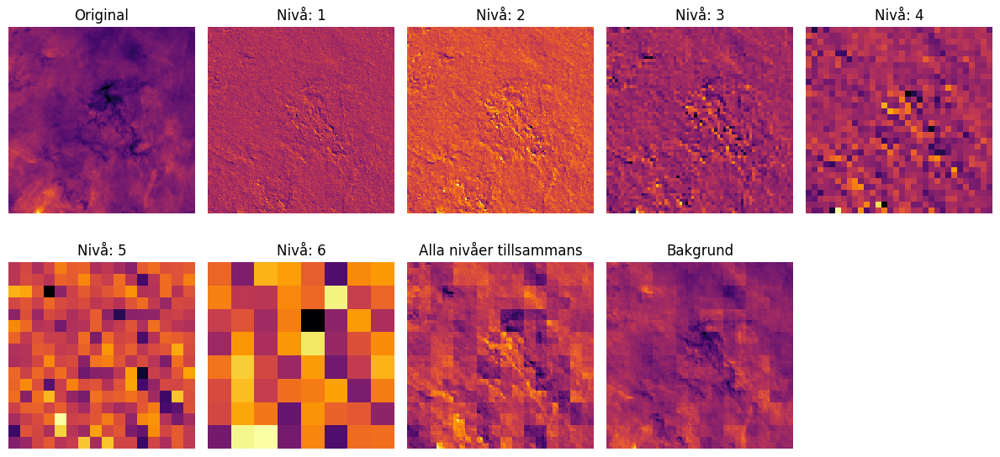

In [24]:
# background from 3 level haar wavelet transform
wavelet = "haar"
max_level = 6
LL = data

fig = plt.figure(figsize=(12, 6))

# data = gaussian_filter(data, 3)

# add original image
ax = fig.add_subplot(2, (max_level + 3)//2+1, 1)
ax.imshow(data, cmap='inferno')
ax.set_title("Original")
ax.axis('off')
print("Original", "Mean:", np.mean(data), "Std:", np.std(data), "Max:", np.max(data), "Min:", np.min(data))

background = np.zeros(np.shape(data), dtype=np.float32)

for level in range(1, max_level + 1):
    coeffs = pywt.dwt2(LL, wavelet)
    LL, (LH, HL, HH) = coeffs

    ax = fig.add_subplot(2, (max_level + 3)//2+1, level + 1)
    all_details = np.kron(LH + HL + HH, np.ones((2**level, 2**level))) * (2**(-level))
    ax.imshow(all_details, cmap='inferno')
    ax.set_title("Nivå: " + str(level))
    ax.axis('off')

    print("Level:", level, "Mean:", np.mean(all_details), "Std:", np.std(all_details), "Max:", np.max(all_details), "Min:", np.min(all_details))
    background += all_details

print("Backgrnd", "Mean:", np.mean(background), "Std:", np.std(background), "Max:", np.max(background), "Min:", np.min(background))
ax = fig.add_subplot(2, (max_level + 3)//2+1, max_level + 2)
ax.imshow(background, cmap='inferno')
ax.set_title("Alla nivåer tillsammans")
ax.axis('off')


diff = data - background
diff = diff - np.min(diff) # shift to positive values

ax = fig.add_subplot(2, (max_level + 3)//2+1, max_level + 3)
ax.imshow(diff, cmap='inferno')
ax.set_title("Bakgrund")
ax.axis('off')

fig.tight_layout()
plt.savefig("waveletfinalresult.eps", format="eps", bbox_inches="tight", pad_inches=0)